# Analysis code for the behavioural figure panels in Lamire et al., 2022

In [3]:
import os
import glob
import numpy as np
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import seaborn
import warnings
import scipy.stats as ss
from scipy.stats import zscore
from statannot import add_stat_annotation
from importlib import reload

import FishTrack
import sys

from scipy.spatial import distance
from scipy.cluster import hierarchy
from matplotlib import colors
from distinctipy import get_colors

compile_screen_data = False # if we need to pull the track and ssmd files out of the original folders
current_dir = os.path.abspath('')
sys.path.append(current_dir)
sys.path.append(os.path.realpath(current_dir + r'/ExtraFunctions/glasbey-master/'))
from glasbey import Glasbey

col_map = seaborn.diverging_palette(300, 120, s=100, l=50, sep=30, as_cmap=True, center="dark")

# analyzing screen data
root_dir = r'Z:/2020_HabScreenPaper/'
screen_data_dir = root_dir + r'/data/screen_data/'
raw_data_dir = r'Z:/GranatoLabData/NoIssues'

os.chdir(screen_data_dir)
#%
if compile_screen_data: # collect screen data into bulk files
    ssmd_names = sorted(glob.glob(raw_data_dir+'/*/*ssmddata_twoMeasures.pkl'))
    track_names = sorted(glob.glob(raw_data_dir+'/*/*trackdata_twoMeasures.pkl'))
    #%

    # copy all the files to screen_data_dir


    import shutil
    for file in ssmd_names:
        orig = os.path.realpath(file)
        move = screen_data_dir + os.path.split(orig)[-1]
        shutil.copyfile(orig, move)

    for file in track_names:
        orig = os.path.realpath(file)
        move = screen_data_dir + os.path.split(orig)[-1]
        shutil.copyfile(orig, move)


    # now work off of compiled files

    ssmd_names = sorted(glob.glob(screen_data_dir+'/*ssmddata_twoMeasures.pkl'))
    track_names = sorted(glob.glob(screen_data_dir+'/*trackdata_twoMeasures.pkl'))

    n_plates = len(ssmd_names)
    n_treat = 0
    track_data_names = []
    for i in range(n_plates):
        with open(ssmd_names[i], "rb") as f:
            ssmd_data = pickle.load(f)
            fingerprint_order = ssmd_data['fingerprint_order']

        with open(track_names[i], "rb") as f:
            track_data = pickle.load(f)

        if i == 0:
            fingerprints = ssmd_data['fingerprint']
            rows = pd.DataFrame(track_data['spreadsheet'])
            names = ssmd_data['names'][1:]


        else:
            fingerprints = np.hstack((fingerprints, ssmd_data['fingerprint']))
            names = names + ssmd_data['names'][1:]
            rows = pd.concat((rows, pd.DataFrame(track_data['spreadsheet'])))
        #print(track_names[i])
        if not len(ssmd_data['names'][1:]) == 40:
            print(ssmd_names[i])
            print(len(ssmd_data['names'][1:]))
        #print('...')
        while len(track_data_names) < len(names):
            track_data_names.append(track_names[i])
    rows = rows.reset_index()     
    #%


    #%
    # remove the last 4 because these were a separate experiment not part of the screen. 
    rows = rows.iloc[:-4,:]
    fingerprints = fingerprints[:, :-4]
    names = names[:-4]

    with open('screen_fingerprints.pkl', "wb") as f:
            pickle.dump(fingerprints, f)

    with open('screen_rows.pkl', "wb") as f:
            pickle.dump(rows, f)

    with open('screen_names.pkl', "wb") as f:
            pickle.dump(names, f)


# load compiled data
os.chdir(screen_data_dir)

with open('screen_fingerprints.pkl', 'rb') as f:
    fingerprints = pickle.load(f)

with open('screen_rows.pkl', "rb") as f:
       rows = pickle.load(f)

with open('screen_names.pkl', "rb") as f:
        names = pickle.load(f)

ssmd_names = sorted(glob.glob(screen_data_dir+'*ssmddata_twoMeasures.pkl'))
track_names = sorted(glob.glob(screen_data_dir+'*trackdata_twoMeasures.pkl'))

with open(ssmd_names[0], 'rb') as f:
    ssmd_data = pickle.load(f)

fingerprint_order = ssmd_data['fingerprint_order']

NaNsPresent = np.sum(np.isnan(fingerprints), axis=0) > 0
fingerprints_nonan = fingerprints[:, ~NaNsPresent]
names_nonan = np.array(names)[np.where(~NaNsPresent)[0]]
rows_nonan = rows.iloc[np.where(~NaNsPresent)[0], :]

gb = Glasbey()
p = gb.generate_palette(size=45)
p = p[1:]
p = np.flipud(p)
col_vec = []
p[p>1] = 1
p[p<0] = 0
for col in p:
    col_vec.append(colors.to_hex(col.astype('double')))

# Figure 1, clustered heatmap of all data

<Figure size 1440x720 with 0 Axes>

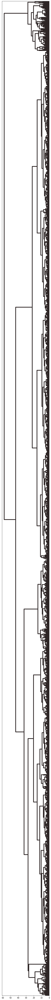

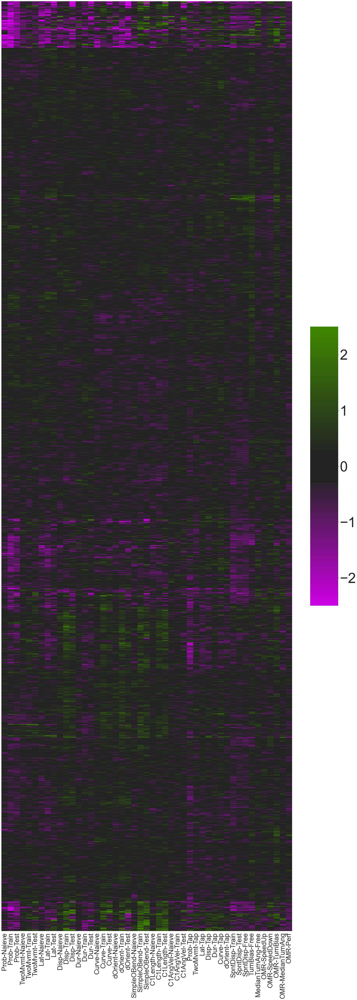

In [4]:

out_dir = root_dir + r'Figure1/'
os.chdir(out_dir)
plt.figure(figsize=(20,10))
hierarchy.set_link_color_palette(col_vec)
col_linkage_all = hierarchy.linkage(
    distance.pdist(fingerprints_nonan.T), 
    metric = 'seuclidean', 
    method='ward')

plt.figure(figsize=(4, 75.39))
with plt.rc_context({'lines.linewidth': 4}):
    R_all = hierarchy.dendrogram(col_linkage_all,
                color_threshold = 100, 
                orientation='left',
                distance_sort='descending', 
                no_labels = True,
                above_threshold_color=colors.to_hex((0.6,0.6,0.6))
            )
 

    plt.tight_layout()
    plt.savefig('dendrogram_all.svg', transparent=True)
    plt.savefig('dendrogram_all.png', transparent=True)
    plt.show()
#%
seaborn.set(font_scale=3.5)
fig = plt.figure(figsize=(30, 80))

hmap = seaborn.heatmap(np.flipud(fingerprints_nonan[:, R_all['leaves']].T), 
    vmax=2.5, vmin=-2.5, cmap=col_map, linewidths=0, cbar_kws={"shrink": .3, "aspect":10},
    xticklabels=fingerprint_order, yticklabels=False)
plt.tight_layout()
cbar = hmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=80)
plt.savefig('heatmap_all.png',  transparent=True)
plt.savefig('heatmap_all.svg', transparent=True)
plt.show()

rows.to_csv(out_dir+'Drugs_All_Info.csv')
rows_nonan.to_csv(out_dir+'Drugs_NoNaN_Info.csv')

fprint_df_all = pd.DataFrame(fingerprints_nonan, 
    index=fingerprint_order, columns=names_nonan)
fprint_df_all.to_csv(out_dir+'Drugs_NoNaN_fingerprints.csv')

# Figure 2, analyses of hits

['Amorolfine HCl', 'Chloroxine', 'Flurbiprofen', 'Albendazole', 'NSC 405020', 'Arbidol HCl', 'Tolnaftate', 'Tacrolimus (FK506)', 'Rilpivirine', 'Epiandrosterone', 'Melatonin', 'Ethinyl Estradiol', 'Cyproterone Acetate', 'Leflunomide', 'Telmisartan', 'Chlorquinaldol', 'Gemfibrozil', 'Alprostadil', 'Ziprasidone HCl', 'Fenoprofen Calcium', 'Reserpine', 'Oxibendazole', 'Lubiprostone', 'Fenofibrate', 'Mestranol', 'Haloperidol', 'Nobiletin', 'Piperine', 'Sesamin', 'Ipriflavone (Osteofix)', 'Biochanin A', 'Osthole', 'Tangeretin', 'Xanthone', 'Sclareolide', 'Carprofen', 'Chlorocresol', 'Pramoxine HCl', 'Domiphen Bromide', 'Cyclandelate', 'Azaperone', 'Quinacrine 2HCl', 'SC144', '(S)-crizotinib', 'Oxaprozin', 'Vilazodone HCl', 'ZLN005', 'Piroxicam', 'Clofibrate (Atromid-S)', 'Nimesulide', 'Liranaftate', 'ML130 (Nodinitib-1)', 'Tolfenamic Acid', 'Dexmedetomidine HCl (Precedex)', 'Dequalinium chloride', 'Phenothrin', 'Nalmefene HCl', 'Ethoxzolamide', 'Amoxapine', 'Colistimethate Sodium', 'Terfena

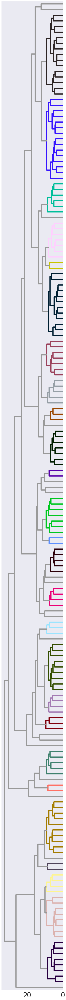

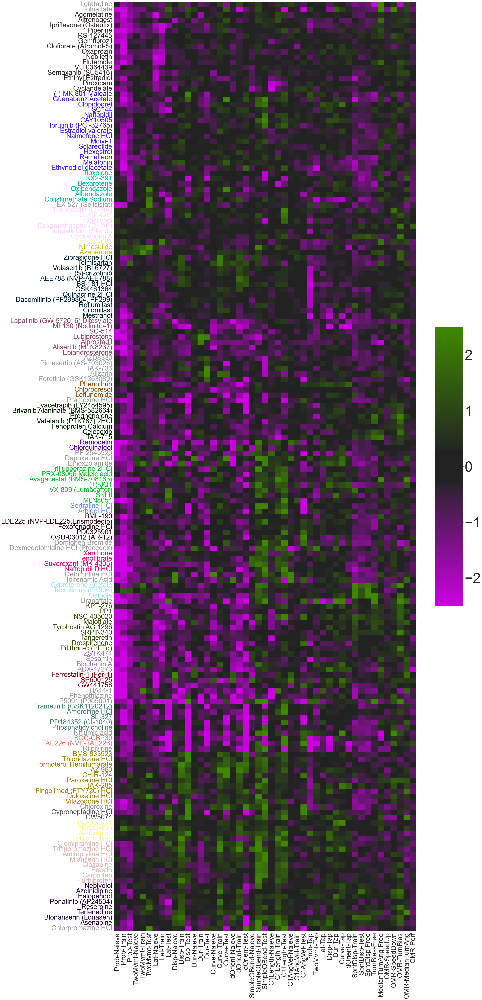

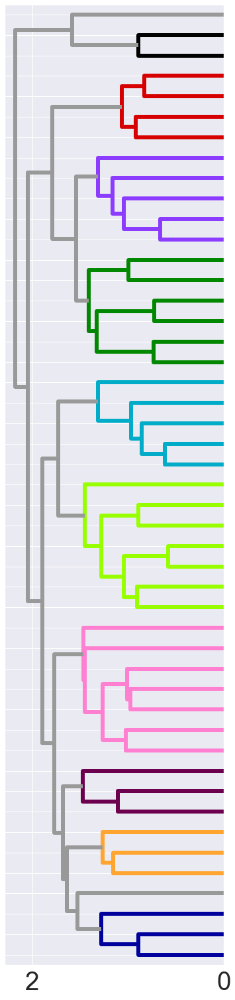

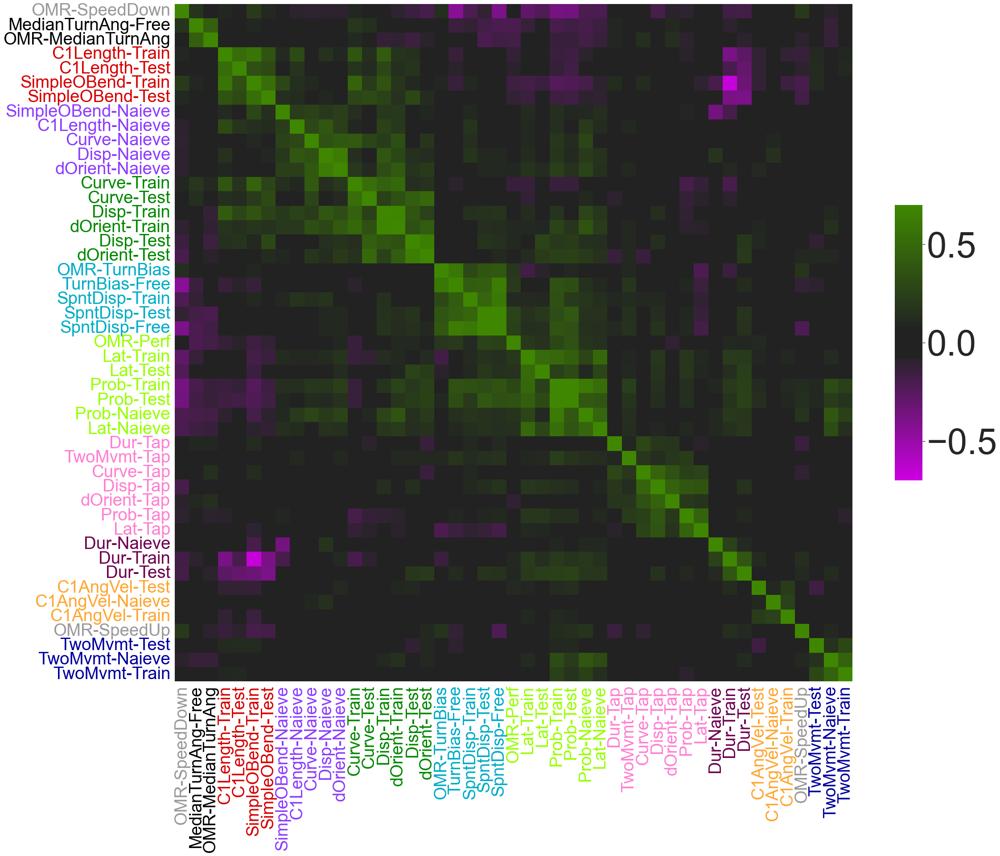

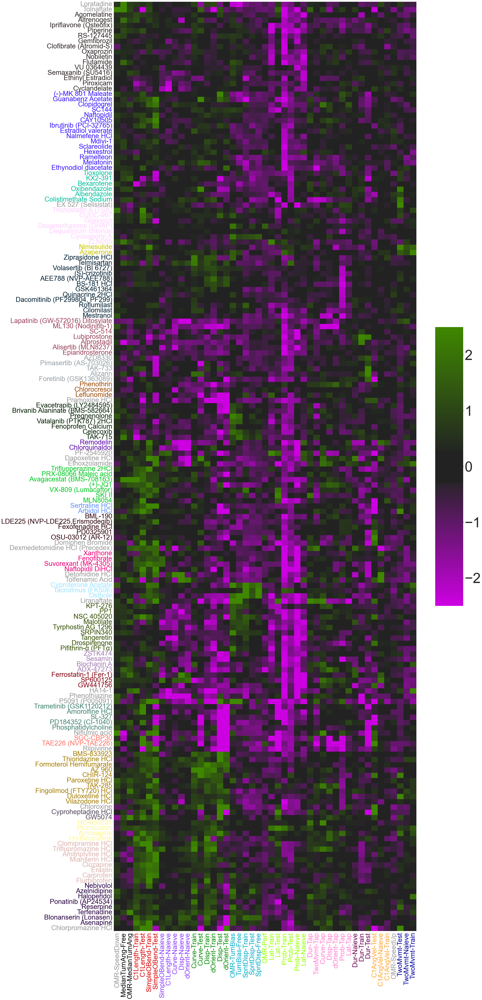

C:\Users\owen.randlett\AppData\Local\Temp/ipykernel_23064/1218742031.py:182: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  col_dendro = np.array(R['leaves_color_list'])


[array([166, 152, 163, 116, 161, 101,  69]), array([ 18,  14,  87,  43,  79,  77,  86,  41,  83, 120, 117,  24]), array([ 78,  76,  90, 118,  72]), array([156,  62, 129,  84,  88, 141,  96, 100, 139,  45]), array([142,   5]), array([171, 155,  25,  81,  20,  60, 157, 131]), array([49, 40]), array([164,  64,  58, 153]), array([113,  15]), array([12,  7, 31]), array([145, 136, 150,  73,  66]), array([91,  0, 70, 68, 63]), array([112,  92]), array([137,  61, 144, 128, 138, 123,  35,   2]), array([65, 51, 98, 22, 17, 75,  9]), array([170, 151,  29,  27, 175,  16,  48,  44,  26, 108, 154,  99,  11,
        47,  39]), array([133,  97]), array([ 74,  28,  30, 140]), array([119,  67, 130,  71,  19, 106,  93]), array([111,  95, 168, 107,  54, 167,  46]), array([121,  89, 105,  21,   3,  59]), array([148, 147, 126,  42, 174,  85,  82, 146,  56, 109,  34, 134, 125,
        10, 149]), array([ 33,  23, 159, 132]), array([162,  94,   4, 115, 102, 104,  32, 127, 110]), array([55, 36, 13]), array([124

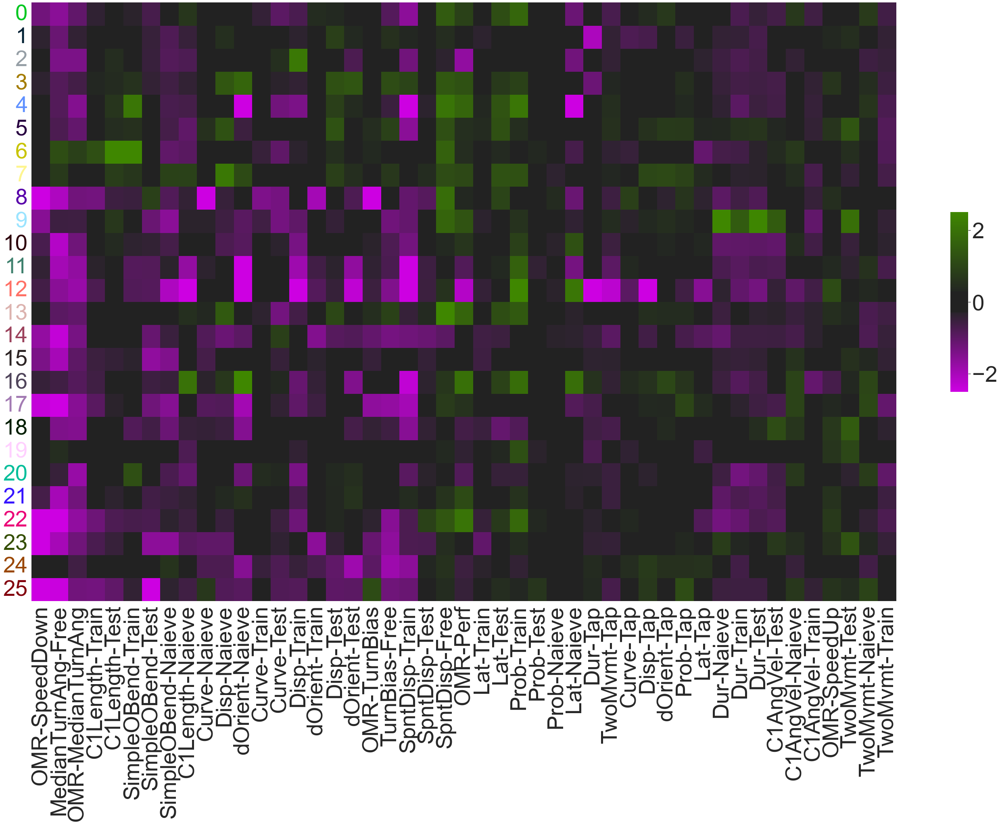

In [5]:

out_dir = root_dir + r'Figure2/'
os.chdir(out_dir)
# clustermap of "hits"

max_ssmd = np.max(abs(fingerprints_nonan), axis=0)

ssmd_thresh = 2
id_hits = np.where((max_ssmd > ssmd_thresh))[0]
fprints_thresh = fingerprints_nonan[:, id_hits]


names_thresh = []
for i in id_hits:
    names_thresh.append(names_nonan[i])

col_vec_drugs = col_vec.copy()
hierarchy.set_link_color_palette(col_vec_drugs)
col_linkage = hierarchy.linkage(
    distance.pdist(fprints_thresh.T), 
    metric = 'seuclidean', 
    method='ward')

print(names_thresh)
print('number of hits = ' + str(len(names_thresh)))
rows_hits = rows_nonan.iloc[id_hits,:]
rows_hits.to_csv(out_dir+'Hits_Drugs_Info.csv')
fprint_df = pd.DataFrame(fprints_thresh, 
    index=fingerprint_order, columns=names_thresh)
fprint_df.to_csv(out_dir+'Hits_Drugs_Fingerprints.csv')

plt.figure(figsize=(6, 75.39))
with plt.rc_context({'lines.linewidth': 6}):
    R = hierarchy.dendrogram(col_linkage,
                color_threshold = 9.5, 
                orientation='left',
                no_labels = True,
                #labels=names_thresh,
                distance_sort='descending', 
                leaf_font_size = 29,
                above_threshold_color=(0.6,0.6,0.6)
            )
 
    ax = plt.gca()
    ax.invert_yaxis()
    # ylbls = ax.get_ymajorticklabels()
    # for ind, lbl in enumerate(ylbls):
    #     lbl.set_color(R['leaves_color_list'][ind])

    plt.tight_layout()
    plt.savefig('dendrogram_hits.svg', transparent=True)
    plt.savefig('dendrogram_hits.png',  transparent=True)
    plt.show()

#% heatmap
seaborn.set(font_scale=3.5)
fig = plt.figure(figsize=(40, 80))

ind_clust = np.array(R['leaves'])
names_thresh_reorder = []
for k, fp in enumerate(names_thresh):
    names_thresh_reorder.append(names_thresh[ind_clust[k]])

hmap = seaborn.heatmap(np.flipud(fprints_thresh[:, np.flip(ind_clust)].T), 
    vmax=2.5, vmin=-2.5, cmap=col_map, linewidths=0, cbar_kws={"shrink": .3, "aspect":10},
    xticklabels=fingerprint_order, yticklabels=names_thresh_reorder)

cbar = hmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=80)
ax = plt.gca()
ylbls = ax.get_ymajorticklabels()

for ind, lbl in enumerate(ylbls):
    lbl.set_color(R['leaves_color_list'][ind])


plt.tight_layout()
plt.savefig('heatmap_hits.svg', transparent=True)
plt.savefig('heatmap_hits.png', transparent=True)
plt.show()
#%
#% plot clustered correlogram
from scipy.stats import spearmanr
corr = np.corrcoef(fingerprints_nonan)
#corr, p = spearmanr(fingerprints_nonan, axis=1)

col_vec_fprints = col_vec.copy()
col_vec_fprints.reverse()

#%
hierarchy.set_link_color_palette(col_vec_fprints)
col_linkage = hierarchy.linkage(
    distance.pdist(corr), metric = 'correlation', method='average')
#%
plt.figure(figsize=(6, 22))
with plt.rc_context({'lines.linewidth': 6}):
    R_corr = hierarchy.dendrogram(col_linkage,
                color_threshold = 1.5, 
                orientation='left',
                labels=fingerprint_order,
                distance_sort=True, 
                leaf_font_size = 29,
                above_threshold_color=(0.6,0.6,0.6)
            )

    ax = plt.gca()
    ax.invert_yaxis()
    ax.set_yticklabels('')
    # ylbls = ax.get_ymajorticklabels()
    # for ind, lbl in enumerate(ylbls):
    #     lbl.set_color(R_corr['leaves_color_list'][ind])

    plt.tight_layout()
    plt.savefig('dendrogram_comp.svg', transparent=True)
    plt.savefig('dendrogram_comp.png', transparent=True)
    plt.show()
ind_corr = np.array(R_corr['leaves'])
fprintorder_reorder = []
for k, fp in enumerate(fingerprint_order):
    fprintorder_reorder.append(fingerprint_order[ind_corr[k]])
seaborn.set(font_scale=3.5)
fig = plt.figure(figsize=(33,33))
corr_resh = np.copy(corr[ind_corr, :])
corr_resh = corr_resh[:, ind_corr]
hmap = seaborn.heatmap(corr_resh, 
    vmax=0.7, vmin=-0.7, cmap=col_map, linewidths=0, cbar_kws={"shrink": .3, "aspect":10},
    xticklabels=fprintorder_reorder, yticklabels=fprintorder_reorder,
    square=True)
cbar = hmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=80)
ax = plt.gca()
ylbls = ax.get_ymajorticklabels()

for ind, lbl in enumerate(ylbls):
    lbl.set_color(R_corr['leaves_color_list'][ind])

xlbls  = ax.get_xmajorticklabels()

for ind, lbl in enumerate(xlbls):
    lbl.set_color(R_corr['leaves_color_list'][ind])


plt.tight_layout()
plt.savefig('corrprints_hits.svg', transparent=True)
plt.savefig('corrprints_hits.png', transparent=True)
plt.show()


np.savetxt('fingerprint_corr.txt', corr_resh, fmt='%3f', delimiter=',')


#% plot hits heatmaps with clustered behaviour components
seaborn.set(font_scale=3.5)
fig = plt.figure(figsize=(40, 80))

fprints_tresh_clustered = np.copy(fprints_thresh[:,ind_clust])
fprints_tresh_clustered = fprints_tresh_clustered[ind_corr, :].T
hmap = seaborn.heatmap(fprints_tresh_clustered, 
    vmax=2.5, vmin=-2.5, cmap=col_map, linewidths=0, cbar_kws={"shrink": .3, "aspect":10},
    xticklabels=fprintorder_reorder, yticklabels=names_thresh_reorder)

cbar = hmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=80)
ax = plt.gca()
ylbls = ax.get_ymajorticklabels()

for ind, lbl in enumerate(ylbls):
    lbl.set_color(R['leaves_color_list'][ind])

xlbls  = ax.get_xmajorticklabels()

for ind, lbl in enumerate(xlbls):
    lbl.set_color(R_corr['leaves_color_list'][ind])


plt.tight_layout()
plt.savefig('heatmap_hits_clustComp.svg', transparent=True)
plt.savefig('heatmap_hits_clustComp.png', transparent=True)
plt.show()


ind_dendro = np.array(R['leaves'])
col_dendro = np.array(R['leaves_color_list'])
  

# find all unique colors, ignoring ones with less than 2 members which are the grey color
clusters = [value for value in set(col_dendro) if value != (0.6, 0.6, 0.6)]

# get the indexes within
clusters_id = []

for id_str in clusters:
    ids = np.array([i for i, x in enumerate(col_dendro) if x == id_str], dtype=int)
    clusters_id.append(ind_dendro[ids])


print(clusters_id)
for j in range(len(clusters_id)):
    print('...')
    print(j)
    print('...')
    for i in clusters_id[j]:
        print(names_thresh[i])


mean_cluster_fprint = np.zeros((len(clusters_id), len(fingerprint_order)))

for i in range(len(clusters_id)):
    mean_cluster_fprint[i, :] = np.mean(fprints_thresh[:, clusters_id[i]], axis=1)

seaborn.set(font_scale=5)
fig = plt.figure(figsize=(40,30))

hmap = seaborn.heatmap(mean_cluster_fprint[:, :], 
    vmax=2.5, vmin=-2.5, cmap=col_map, 
    linewidths=0, cbar_kws={"shrink": .3, "aspect":10},
    xticklabels=fprintorder_reorder)
plt.yticks(rotation=0) 
ax = plt.gca()
ylbls = ax.get_ymajorticklabels()
# colors are not right right now...
for ind, lbl in enumerate(ylbls):
    lbl.set_color(clusters[ind])

plt.tight_layout()
plt.savefig('heatmap_meanclust.svg', transparent=True)
plt.savefig('heatmap_meanclust.png', transparent=True)
plt.show()

# Figure 3, original screen data

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:62: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fish_ids = np.array(track_data['rois'])[ids]


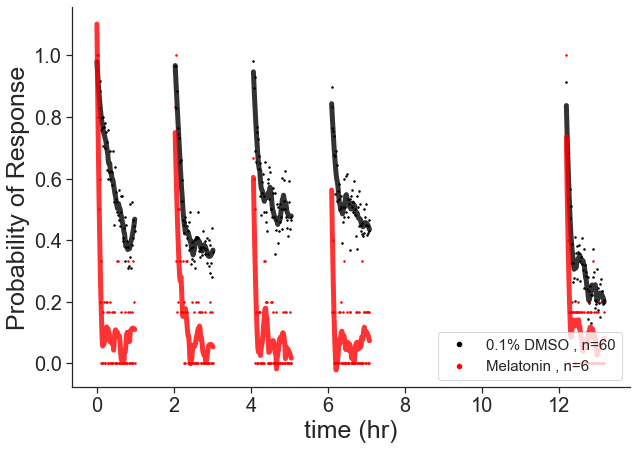

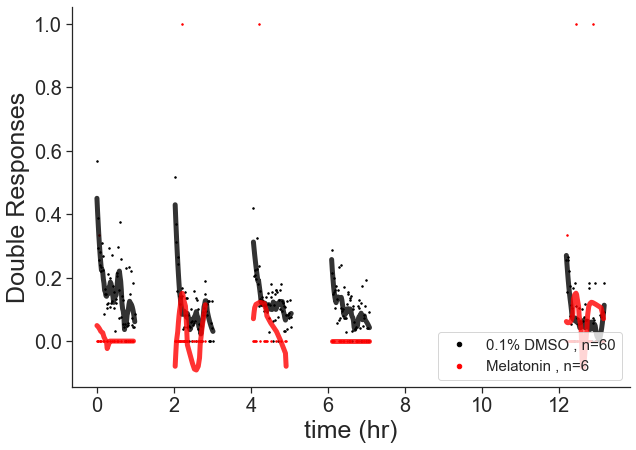

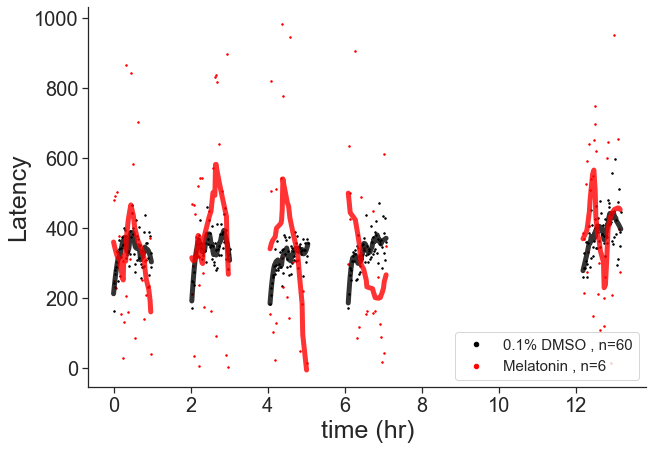

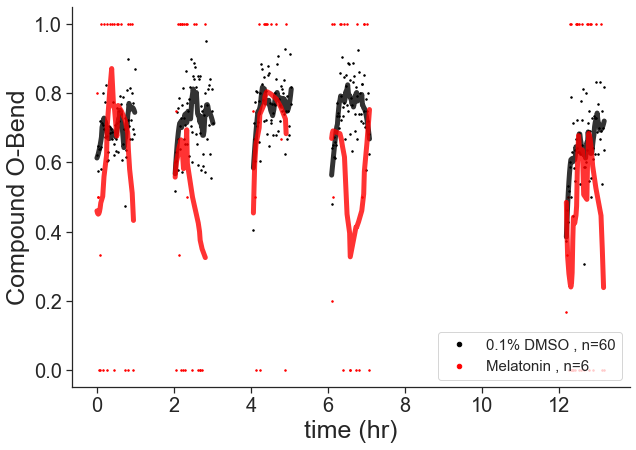

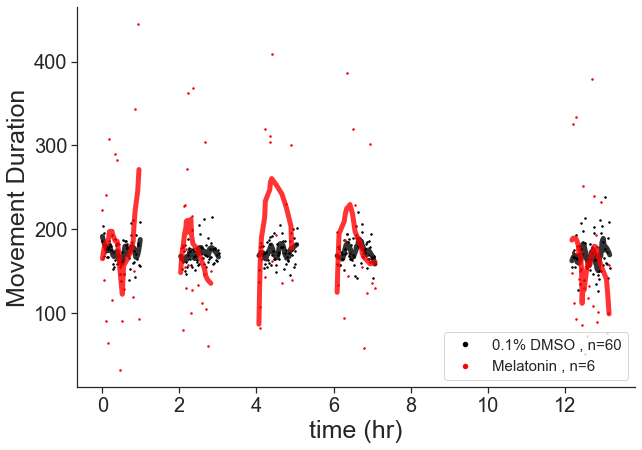

...

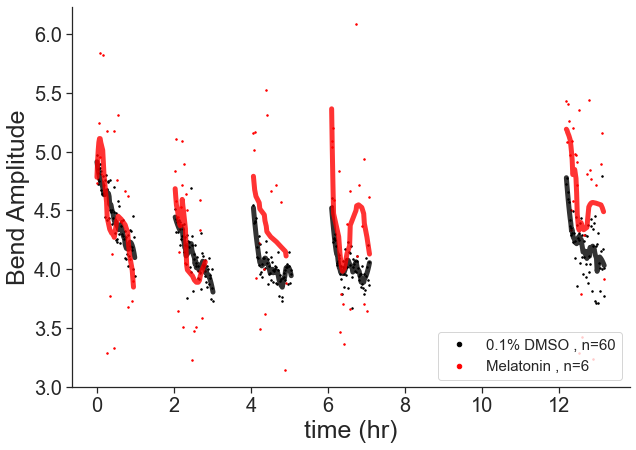

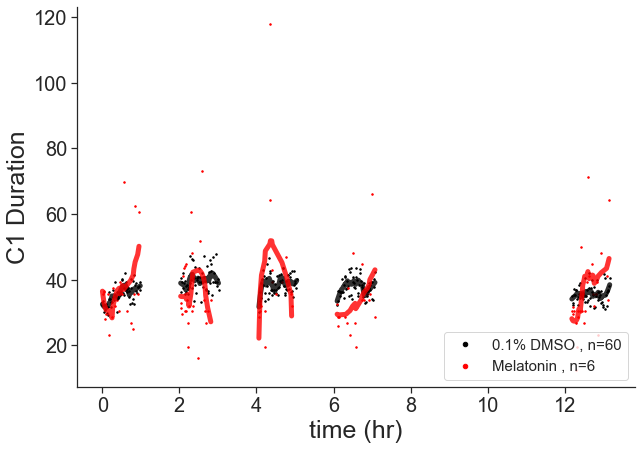

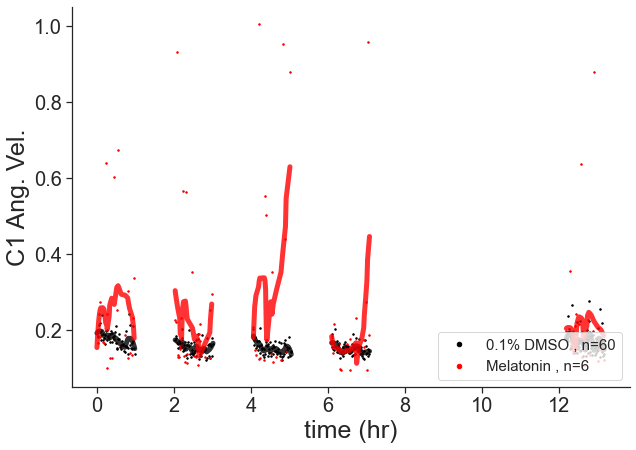

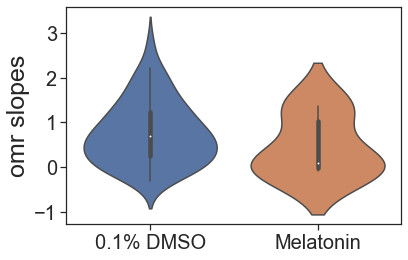

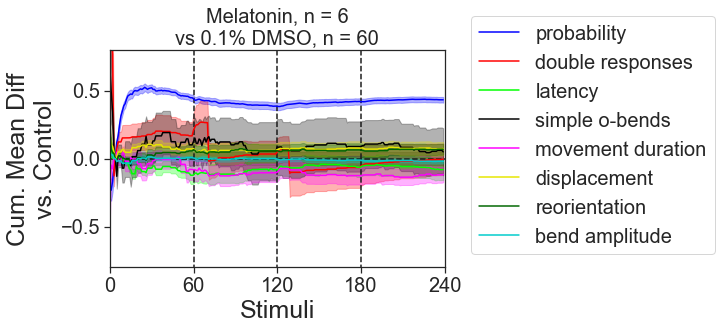

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:62: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fish_ids = np.array(track_data['rois'])[ids]


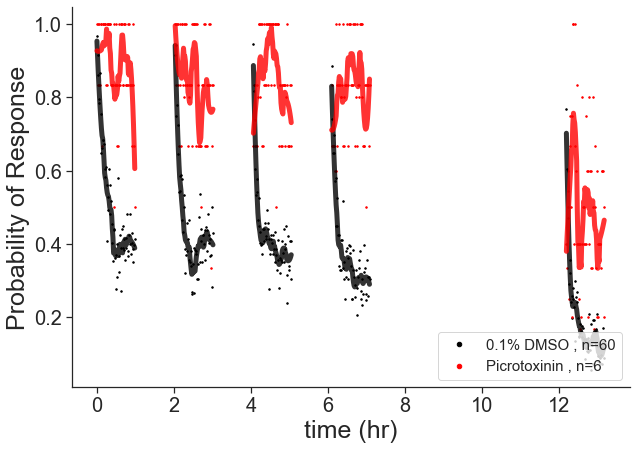

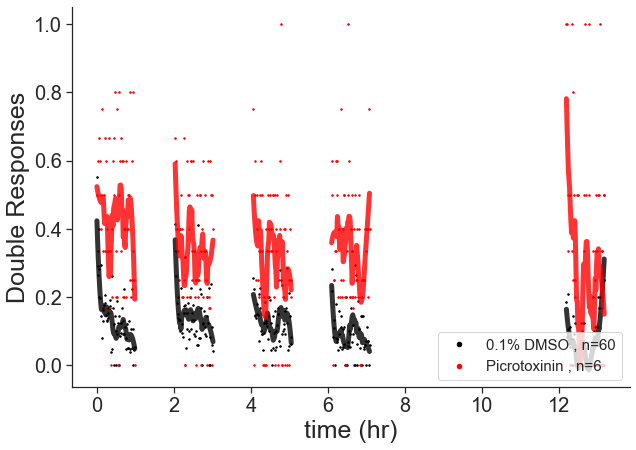

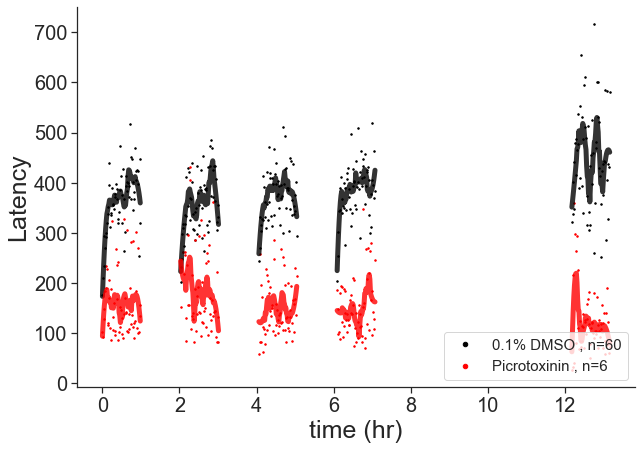

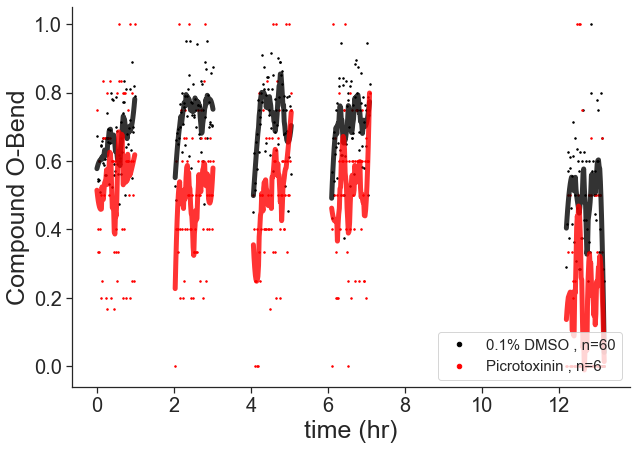

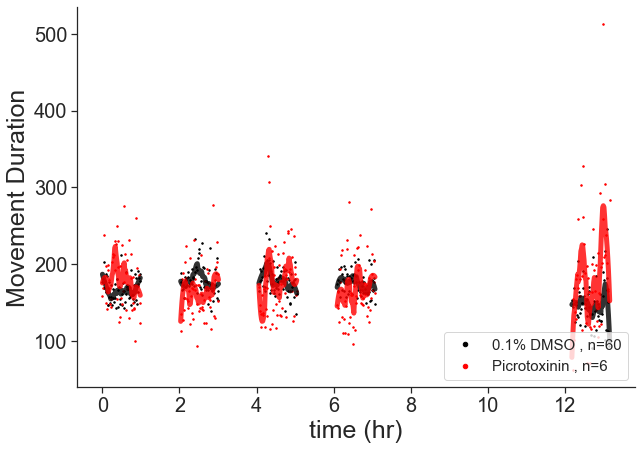

...

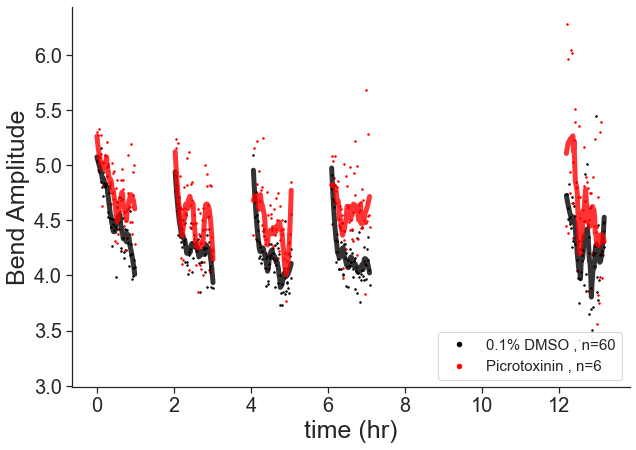

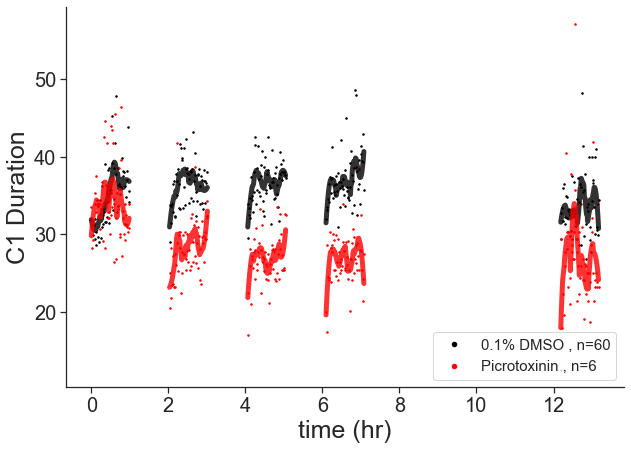

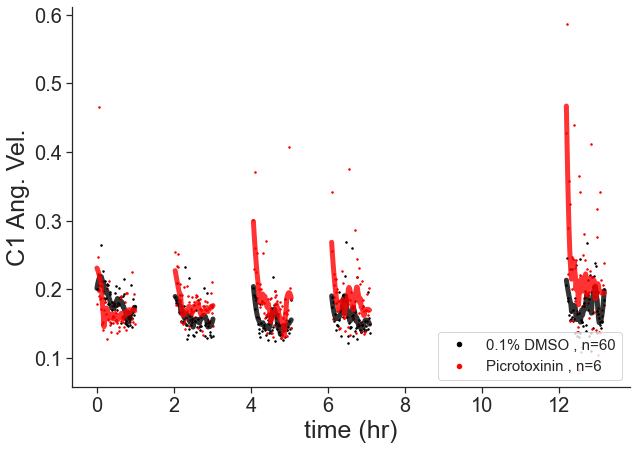

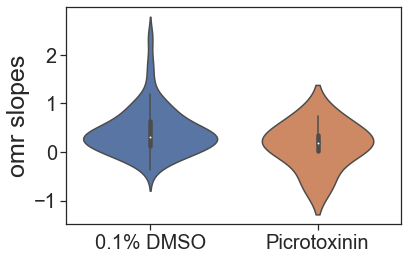

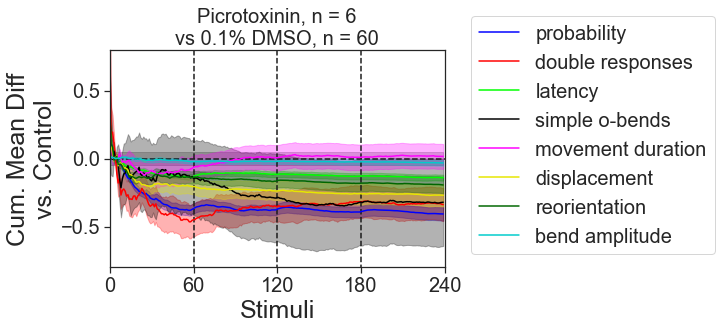

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:62: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fish_ids = np.array(track_data['rois'])[ids]


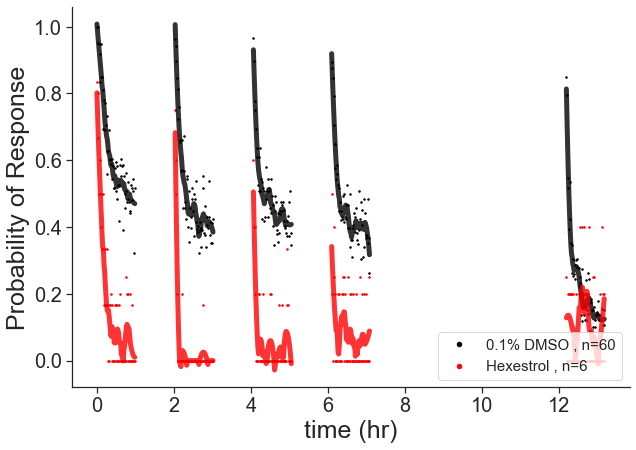

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')


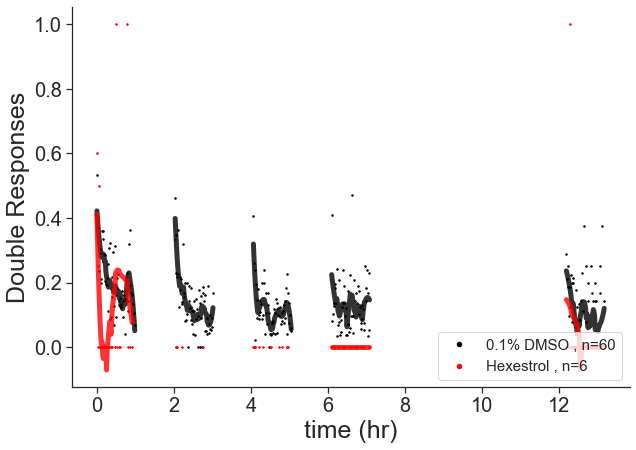

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')


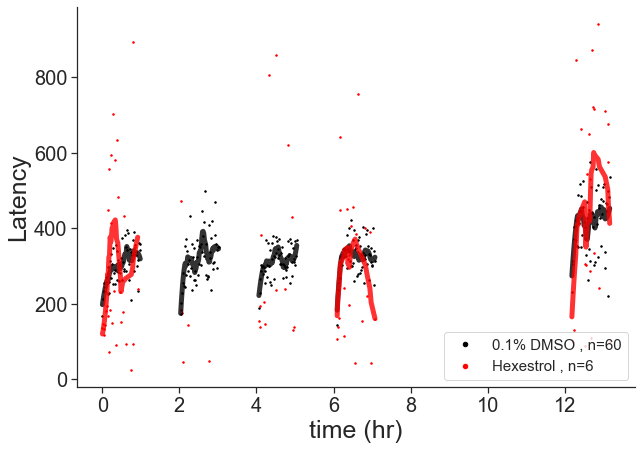

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')


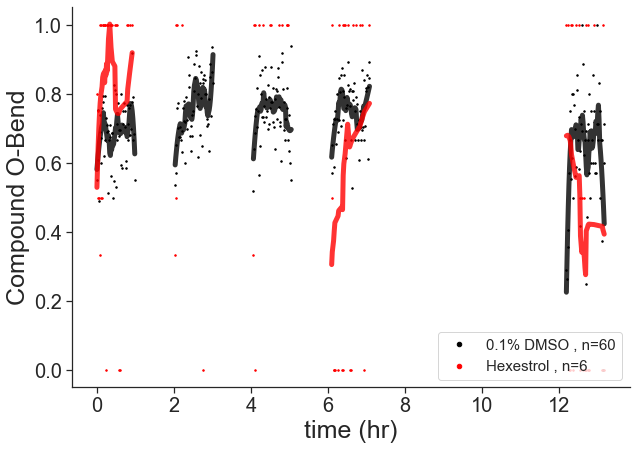

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')


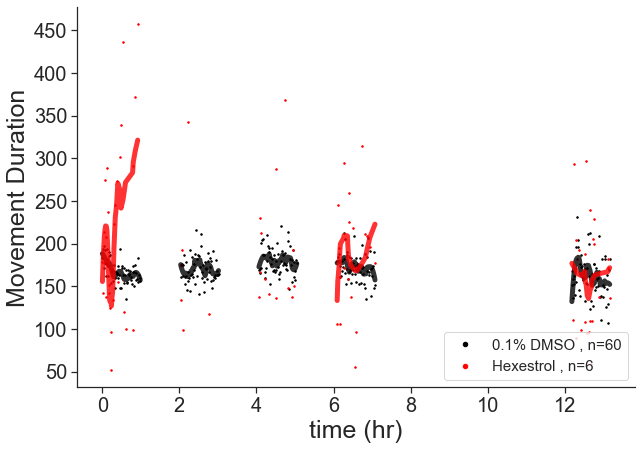

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')


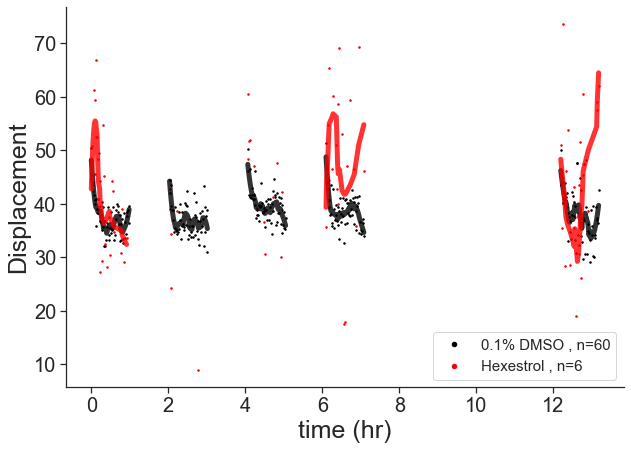

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')


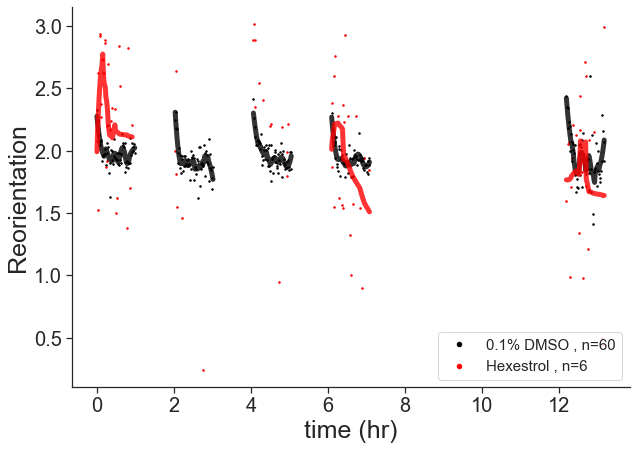

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')


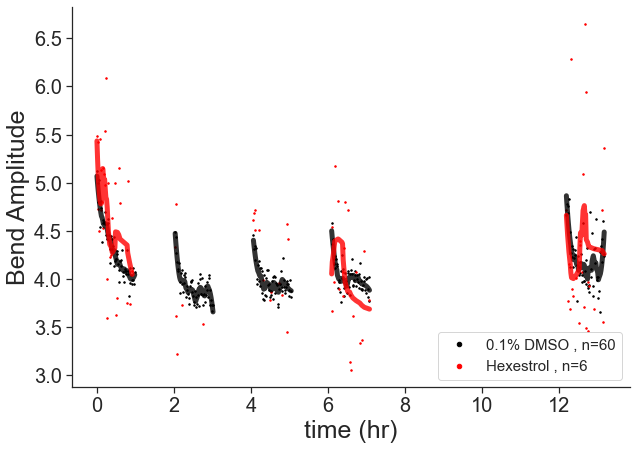

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')


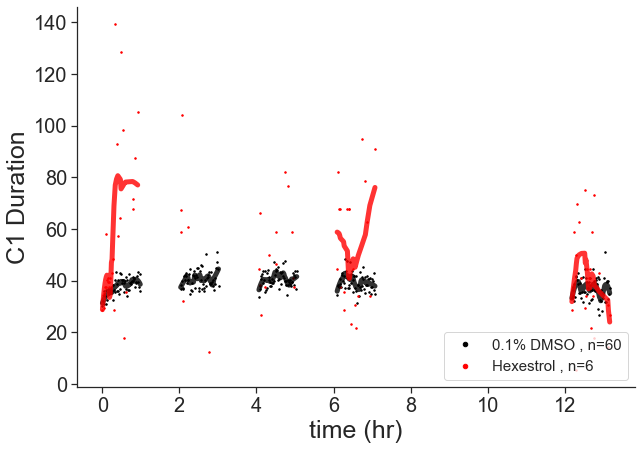

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:108: UserWarning: savgol did not converge
  warnings.warn('savgol did not converge')


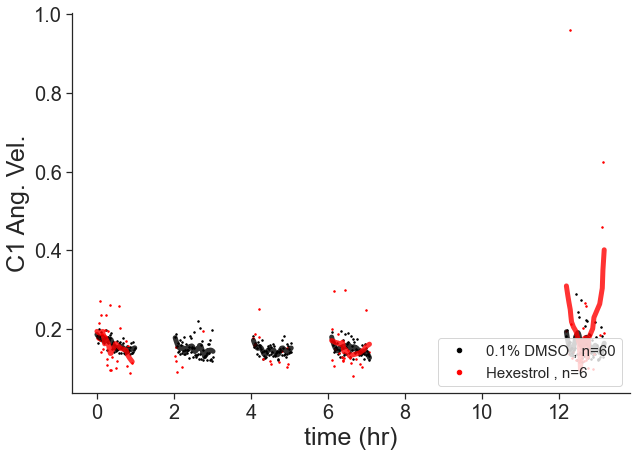

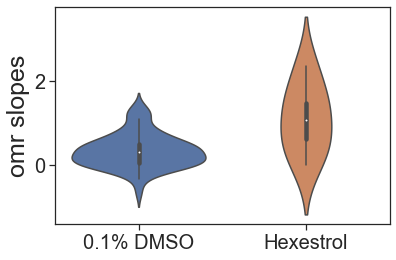

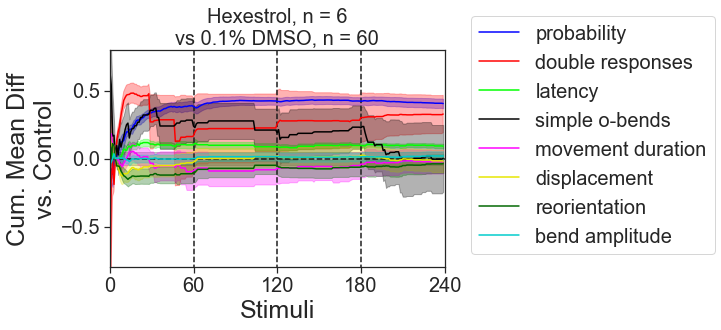

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:62: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fish_ids = np.array(track_data['rois'])[ids]


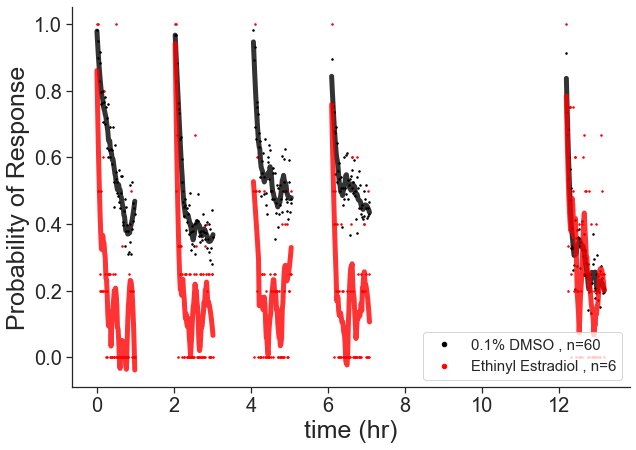

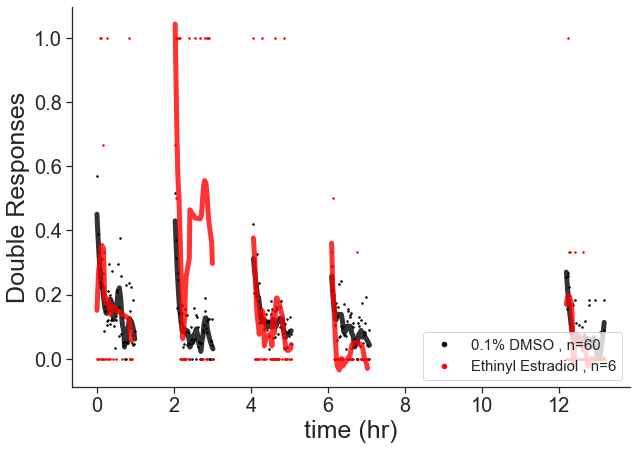

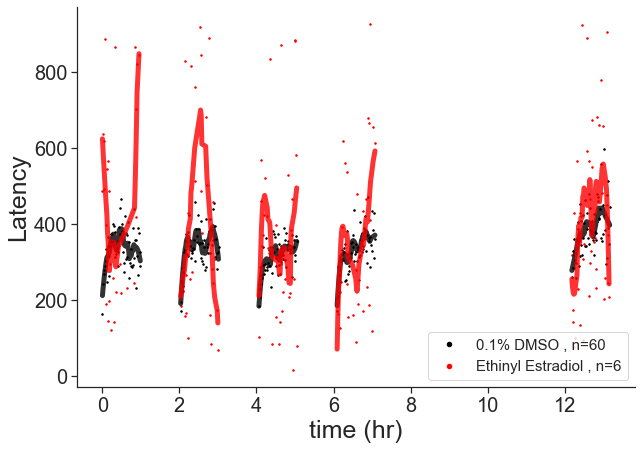

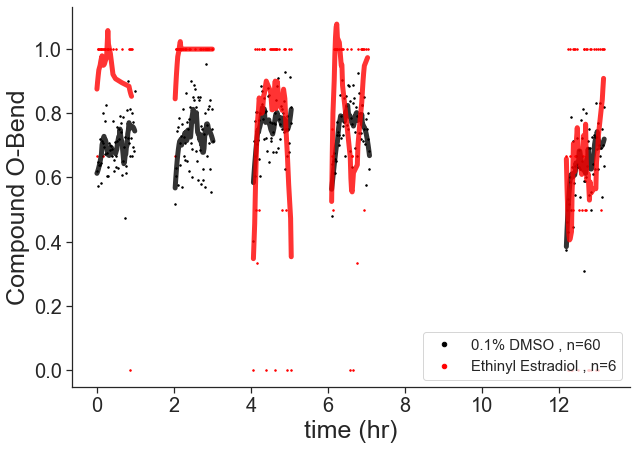

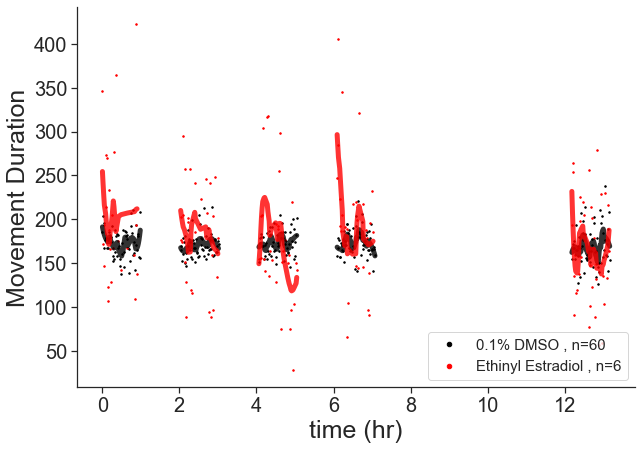

...

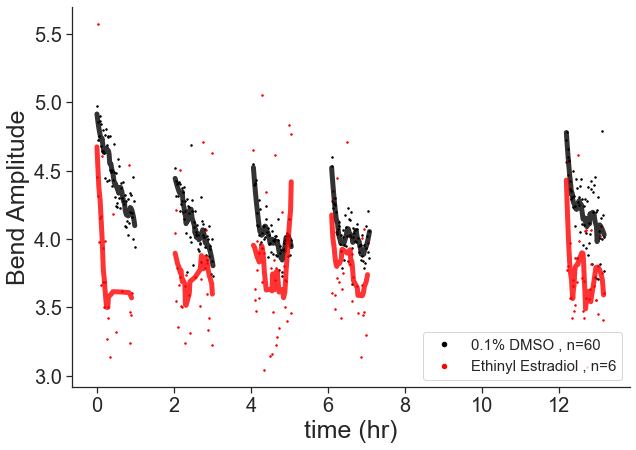

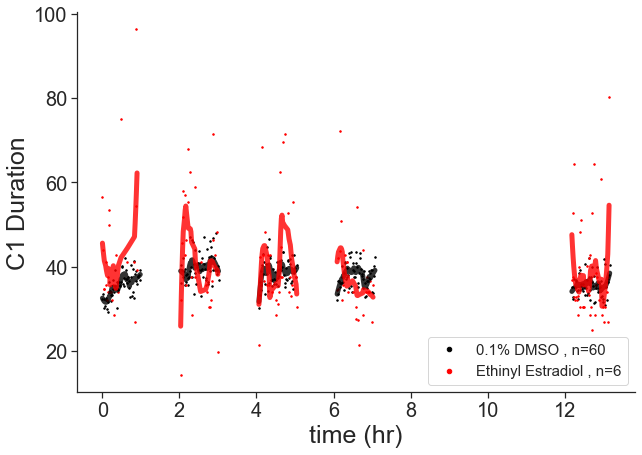

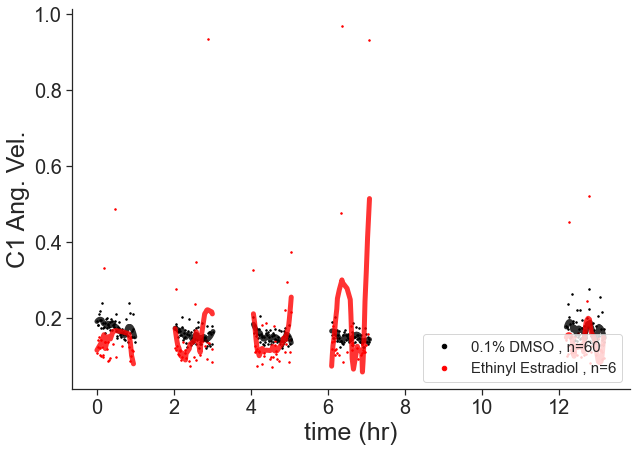

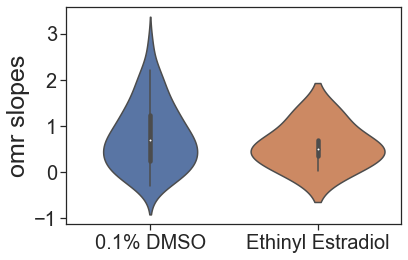

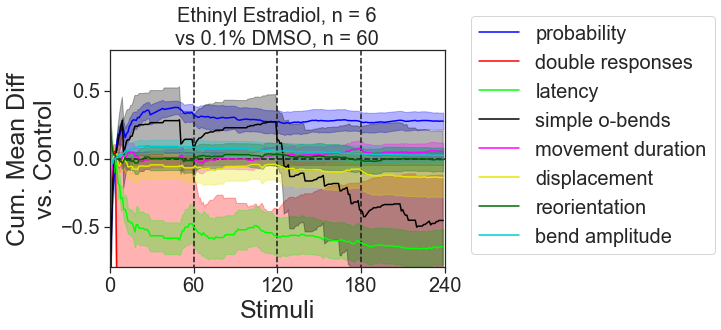

In [7]:
out_dir = root_dir + r'Figure3/'
os.chdir(out_dir)

# plot individual drug data from screen

search_names = ['Melatonin', 'Picrotoxinin', 'Hexestrol', 'Ethinyl Estradiol']

SMALL_SIZE = 20
MEDIUM_SIZE = 25
BIGGER_SIZE = 30

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=SMALL_SIZE)  # fontsize of the figure title
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=RuntimeWarning)
    for search_name in search_names:
        os.chdir(screen_data_dir)
        drug_row = rows[rows['Product Name'].str.contains(search_name)]
        if len(drug_row) == 0:
            warnings.warn('did not find: ' + search_name)
            continue
        date = drug_row['Date Screened'].values[0]
        plate = drug_row['Plate'].values[0]
        for file in track_names:
            file = os.path.basename(file)
            if str.find(file, str(date)) == 0 and str.find(file, 'plate_'+str(plate)) > 0:
                track_file = file

        with open(track_file, "rb") as f:
            track_data_burst = pickle.load(f)
        with open(track_file.replace('trackdata', 'ssmddata'), 'rb') as f:
            ssmd_data_burst = pickle.load(f)
        burst_id = [i for i, elem in enumerate(track_data_burst['names']) if search_name in elem][0]



        col_vec = np.array(((0,0,0),(1,0,0)))
        stim_times = []
        for i in range(len(track_data_burst["TiffTimeInds"])):
            stim_times.append((track_data_burst["TiffTimeInds"][i] - track_data_burst["TiffTimeInds"][0]).total_seconds()/60/60)
        stim_times = np.array(stim_times)

        # when there is a month change there is a problem with the timing. Use default
        if np.max(np.diff(stim_times)) > 2:
            stim_times = np.arange(0, len(stim_times)/60, 1/60)
            for i in range(len(stim_times)):
                stim_times[i] = stim_times[i] + np.floor(i/60)
        
        # make the plots
        if not os.path.exists(out_dir + '/screen_single_drug/' + search_name): 
            os.makedirs(out_dir + '/screen_single_drug/' + search_name)
        os.chdir(out_dir + '/screen_single_drug/' + search_name)
        seaborn.set_style('ticks')
        FishTrack.plot_burst_data_all(track_data_burst, burst_id, 0, col_vec, 'singledrug_' + track_data_burst['names'][burst_id], plot_taps=False)

        
        seaborn.violinplot(data=[track_data_burst['omr_slopes'][track_data_burst['rois'][0]], track_data_burst['omr_slopes'][track_data_burst['rois'][burst_id]]])
        plt.ylabel('omr slopes')
        plt.xticks([0,1],[track_data_burst['names'][0], track_data_burst['names'][burst_id]],)
        plt.show()

        FishTrack.plot_cum_diff(track_data_burst, burst_id, 0, 'singledrug_'+search_name+'_CumulDiff')
        #%

        #%

# Figure 3, Repeat data analysis

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:62: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fish_ids = np.array(track_data['rois'])[ids]


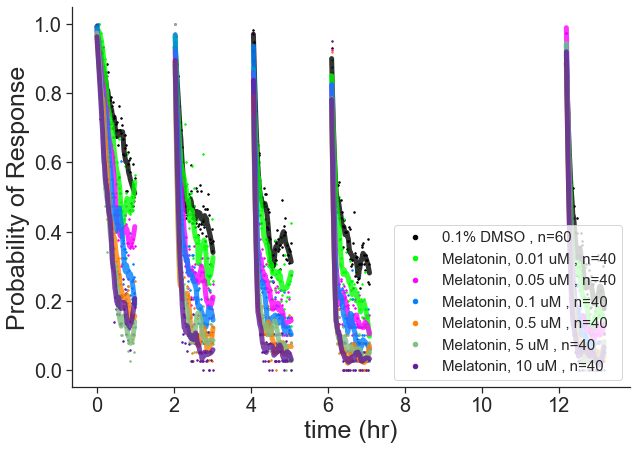

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+st

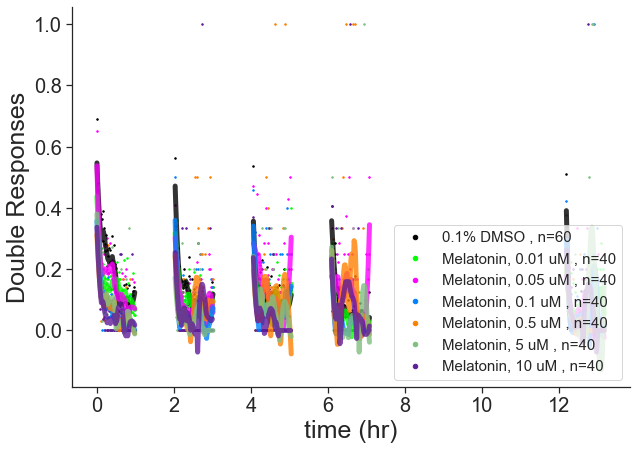

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+st

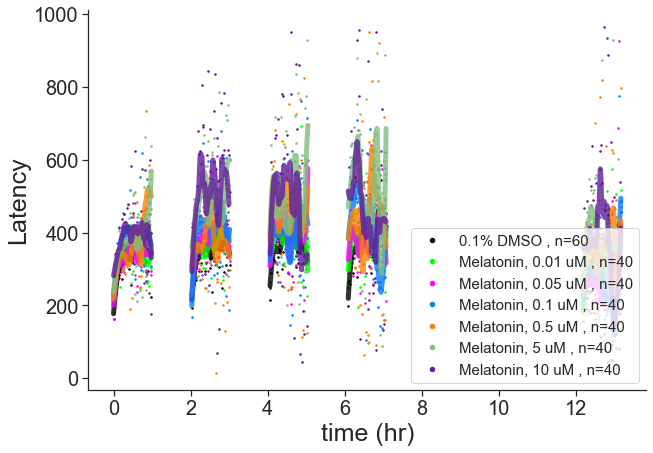

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+st

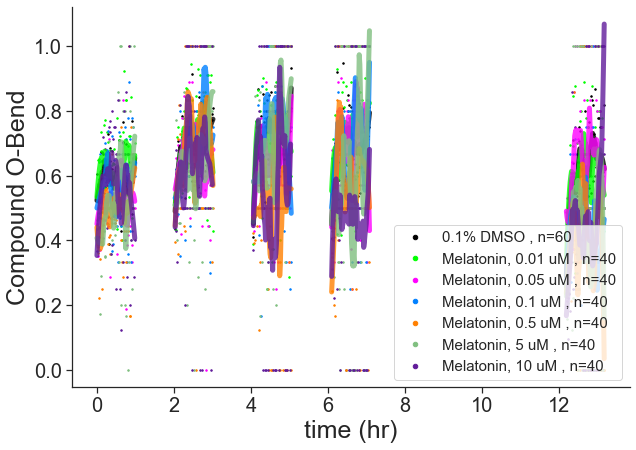

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+st

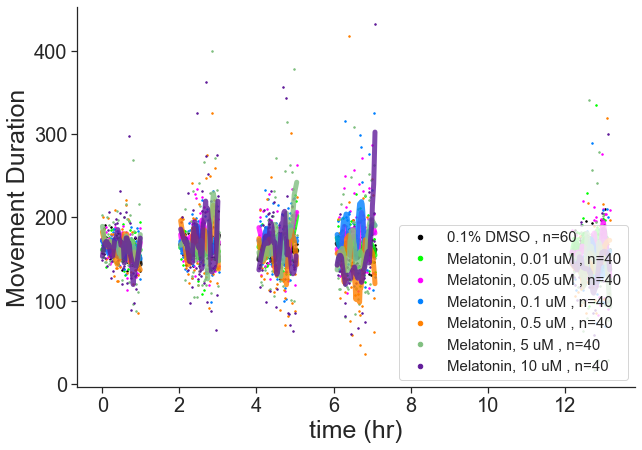

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+st

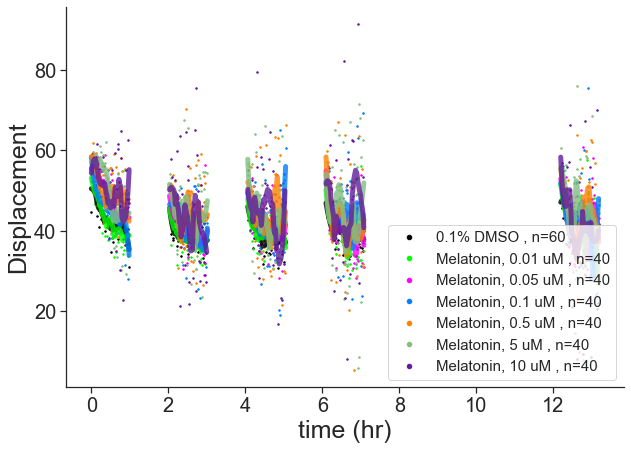

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+st

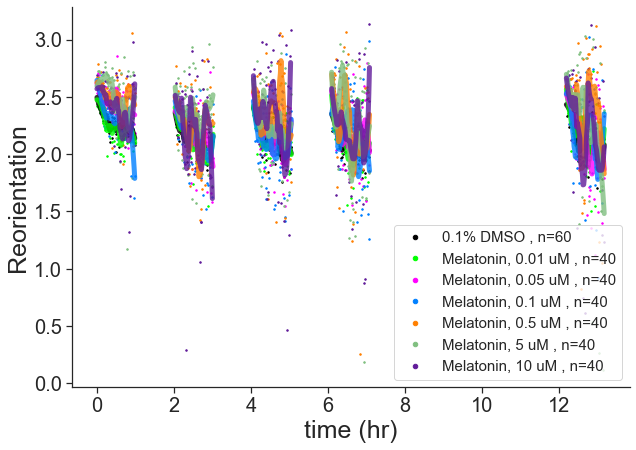

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+st

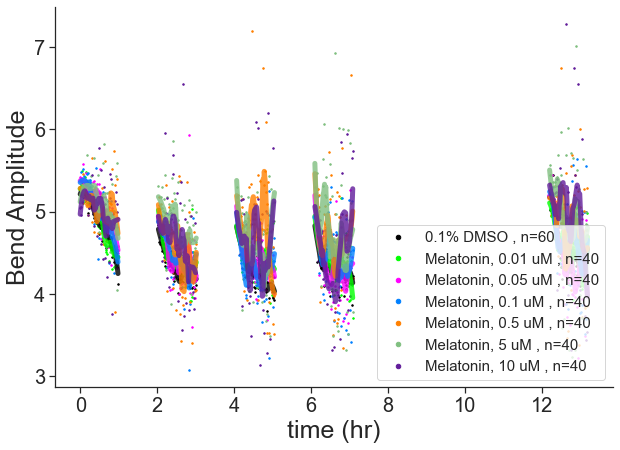

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+st

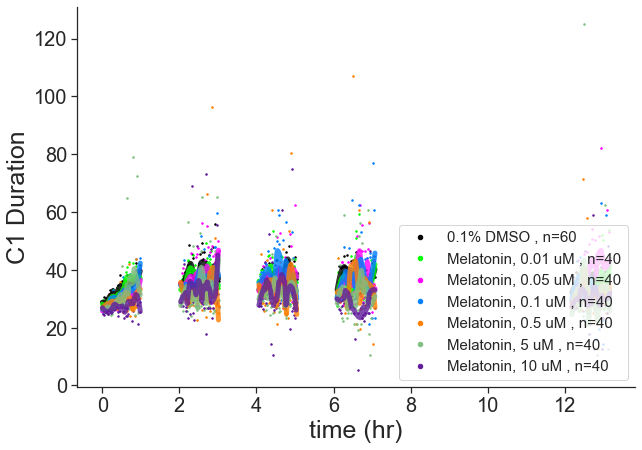

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+str(len(inds_fish)) )
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:87: RuntimeWarning: Mean of empty slice
  plt.plot(time_inds[inds_stim], np.nanmean(data[inds_both], axis=1), '.', markersize=3, color= col_vec[i], label=fish_names[i]+' , n='+st

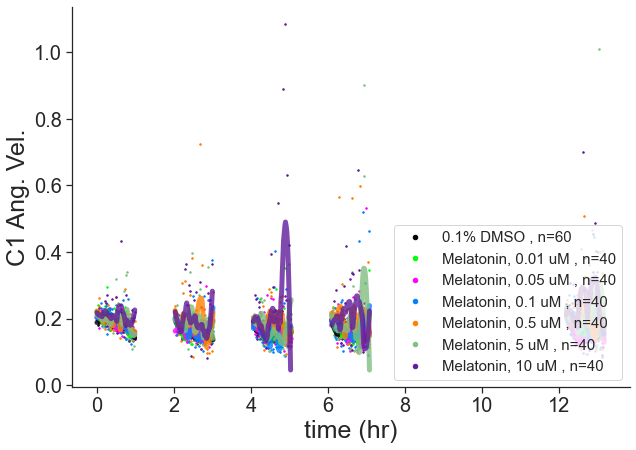

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

0.1% DMSO v.s. Melatonin, 0.01 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.118e+03
0.1% DMSO v.s. Melatonin, 0.05 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.320e+03
0.1% DMSO v.s. Melatonin, 0.1 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.767e-01 U_stat=1.416e+03
0.1% DMSO v.s. Melatonin, 0.5 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.229e+03
0.1% DMSO v.s. Melatonin, 5 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.825e-01 U_stat=9.360e+02
0.1% DMSO v.s. Melatonin, 10 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.100e+03


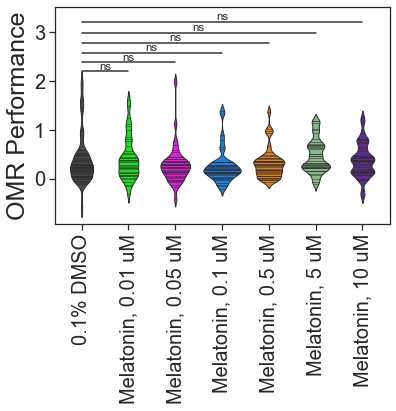

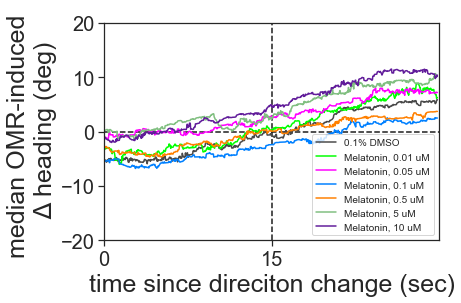

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

0.1% DMSO v.s. Melatonin, 0.01 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.088e+03
0.1% DMSO v.s. Melatonin, 0.05 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.213e+03
0.1% DMSO v.s. Melatonin, 0.1 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.280e+03
0.1% DMSO v.s. Melatonin, 0.5 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.379e+03
0.1% DMSO v.s. Melatonin, 5 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.351e+03
0.1% DMSO v.s. Melatonin, 10 uM: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.132e-01 U_stat=1.459e+03


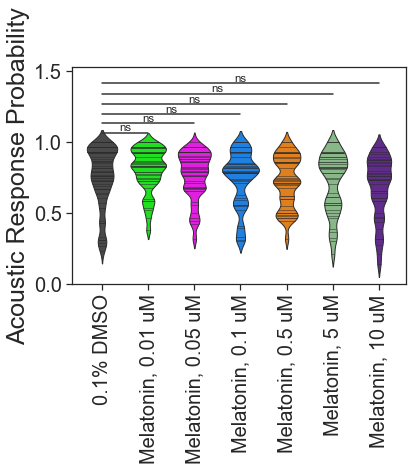

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: Run

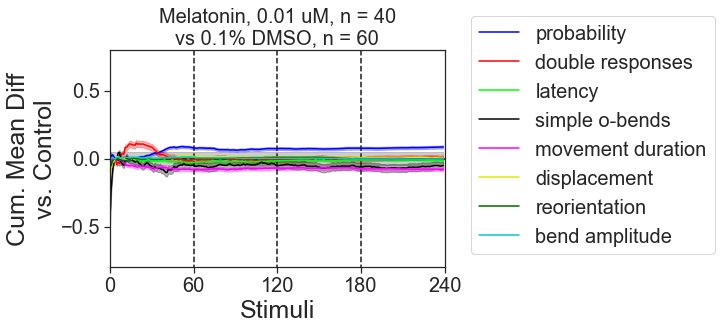

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: Run

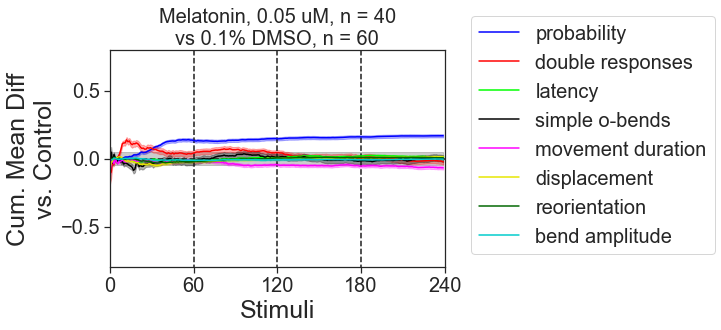

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: Run

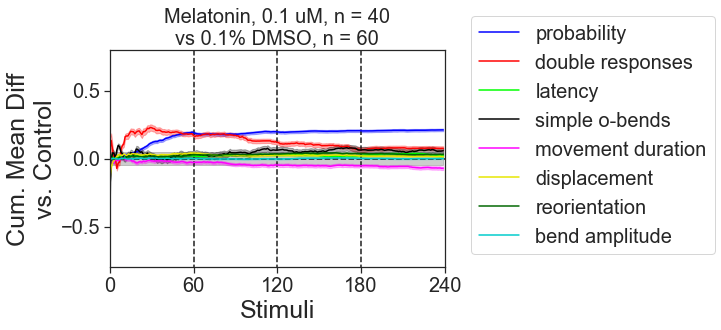

c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)
c:\Users\owen.randlett\Documents\fish_track\FishTrack.py:186: RuntimeWarning: Mean of empty slice
  mean_treat = np.nanmean(treat_data[:, np.random.randint(0, n_treat, n_treat)], axis=1)


KeyboardInterrupt: 

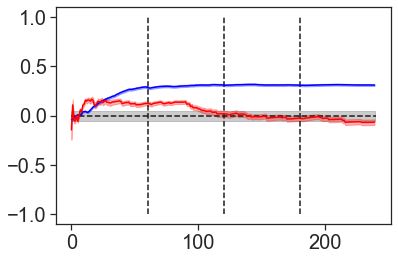

In [8]:
SMALL_SIZE = 20
MEDIUM_SIZE = 25
BIGGER_SIZE = 30

col_vec_repeat = [(0,0,0)]
# p = gb.generate_palette(size=8)
# p = np.flipud(p[1:])

# p[p>1] = 1
# p[p<0] = 0

# for col in p:
#     col_vec_repeat.append(colors.to_hex(col.astype('double')))
# col_vec_repeat.reverse()

p = get_colors(6, exclude_colors=[(0,0,0), (1,1,1)], pastel_factor=0, rng=1,n_attempts=1000)
for col in p:
    col_vec_repeat.append(colors.to_hex(col))


track_files = glob.glob(r'Z:\2020_HabScreenPaper\data\repeat_data\*\*_trackdata_twoMeasures.pkl')

#track_files = glob.glob(r'Z:\2020_HabScreenPaper\data\repeat_data\170828\*_trackdata_twoMeasures.pkl')
#%
def get_unique_drug_names(names_list):
    all_names = []
    for name in names_list:
        all_names.append(name.split(',')[0])
    all_names = list(dict.fromkeys(all_names))
    group_name = ''
    for name in all_names:
        group_name = group_name + '_' + name
    group_name = group_name[1:]
    return all_names, group_name

#%
for track_file in track_files:


    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=SMALL_SIZE)  # fontsize of the figure title
    track_file = os.path.realpath(track_file)

    with open(track_file, "rb") as f:
        track_data = pickle.load(f)
    with open(track_file.replace('_trackdata_', '_ssmddata_'), 'rb') as f:
        ssmd_data = pickle.load(f)
    all_names, group_name = get_unique_drug_names(track_data['names'][1:])
    
    for name in all_names:
        seaborn.set_style('ticks')
        matches = []
        for i, group in enumerate(track_data['names']):
            if name in group and not (
            group == 'Hexestrol, 50uM' or 
            group == 'Hexestrol, 100uM' or 
            group == 'Picrotoxinin, 100uM'):
                matches.append(i)
        
        #matches.reverse()
        matches = np.array(matches)

        # remove condistions that result in NaNs in the fingerprints
        matches = matches[np.sum(np.isnan(ssmd_data['fingerprint'][:, np.array(matches).astype(int)-1]), axis=0) == 0]
        fldr_name = name + '_' + os.path.split(track_file)[1][:8]

        out_dir = root_dir + r'Figure3/repeat_data/'+fldr_name +r'/'

        if not os.path.exists(out_dir): 
            os.makedirs(out_dir)

        os.chdir(out_dir)
        FishTrack.plot_burst_data_all(track_data, matches, 0, col_vec_repeat,name, plot_taps=False)
        
        # plot OMR performance
        col_violin = col_vec_repeat
        col_violin[0] = '#494949'
        violin_data = []
        violin_data.append(track_data['omr_slopes'][track_data['rois'][0]].flatten())
        for id in matches: 
            violin_data.append(track_data['omr_slopes'][track_data['rois'][id]].flatten())
        
        xlabels_violin = [track_data['names'][0]]
        for match in matches:
            xlabels_violin.append(track_data['names'][match])

        def ViolinPlot_wStats(violin_data, xlabels_violin, ylabel_name):
        # make a dataframe to play nice with stats plot
            df_OMR = np.array(
                [violin_data[0].flatten(), 
                np.tile(xlabels_violin[0], len(violin_data[0].flatten()))
                ]
            )
            for i in range(len(xlabels_violin)-1):
                new_array = [violin_data[i+1].flatten(), 
                        np.tile(xlabels_violin[i+1], len(violin_data[i+1].flatten()))
                ]

                df_OMR = np.hstack(
                    (
                        df_OMR,
                        new_array
                    )
                )

            df_OMR = pd.DataFrame(
                {
                    'data':df_OMR[0],
                    'groups':df_OMR[1]
                }
            )
            df_OMR['data'] = pd.to_numeric(df_OMR['data'], errors='coerce')
            

            ax = seaborn.violinplot(data=df_OMR, y ='data', x='groups', palette=col_vec_repeat,
                                bw=0.2,
                                order=xlabels_violin, inner='sticks', linewidth=1)
            H, p = ss.kruskal(*violin_data)
        # if p < 0.05:

            box_pairs = []

            for i in range(1, len(xlabels_violin)):
                box_pairs.append((xlabels_violin[0], xlabels_violin[i]))
            
            test_results = add_stat_annotation(ax, data=df_OMR, y ='data', x='groups', order=xlabels_violin,
                                            box_pairs=box_pairs,
                                            test='Mann-Whitney', text_format='star',
                                            line_height = 0, 
                                            text_offset = 0,
                                            line_offset = 0.01,
                                            fontsize='xx-small',
                                            loc='inside', verbose=2)

            plt.xticks(np.arange(len(violin_data)), xlabels_violin, rotation='vertical')
            plt.ylabel(ylabel_name)
            plt.xlabel('')
        
            plt.savefig(name+ylabel_name+'.png',  transparent=True, bbox_inches='tight')
            plt.savefig(name+ylabel_name+'.svg', transparent=True, bbox_inches='tight')

            plt.show()

        ViolinPlot_wStats(violin_data, xlabels_violin, 'OMR Performance')


        OMR_curves = track_data['acc_lr']
        x = np.arange(OMR_curves.shape[0])/28

        plt.plot(x, np.nanmedian(OMR_curves[:, track_data['rois'][0]], axis=1), color=col_vec_repeat[0], label=track_data['names'][0])
        for k, match in enumerate(matches):
            plt.plot(x, np.nanmedian(OMR_curves[:, track_data['rois'][match]], axis=1), color=col_vec_repeat[k+1], label=track_data['names'][match])
        ylims = [-20, 20]
        plt.ylim(ylims)
        plt.xticks([0, 15])
        plt.xlim([0, 30])
        plt.legend(fontsize=10, loc = 'lower right')
        plt.xlabel('time since direciton change (sec)')
        plt.ylabel('median OMR-induced \n Δ heading (deg)')
        plt.vlines(15, ylims[0], ylims[1], colors = 'k', linestyles='dashed')
        plt.hlines(0, 0, 30, colors = 'k', linestyles='dashed')

        plt.savefig(name+'_OMRcurves_all.png',  transparent=False, bbox_inches='tight')
        plt.savefig(name+'_OMRcurves_all.svg', transparent=False, bbox_inches='tight')

        plt.show()
        tap_responses = np.nanmean(track_data['OBendEvents'][track_data['stim_given'] == 2,:], axis=0)
       
        # plot tap responses per group
        violin_data = []
        violin_data.append(tap_responses[track_data['rois'][0]].flatten())
        for id in matches: 
            violin_data.append(tap_responses[track_data['rois'][id]].flatten())
        
        ViolinPlot_wStats(violin_data, xlabels_violin, 'Acoustic Response Probability')
        for burst_id in matches:
            FishTrack.plot_cum_diff(track_data, burst_id, 0, 'cum_diff'+track_data['names'][burst_id])

        if name == 'Ethynyl Estradiol': # hack fixing ethinyl typo for the moment 
            name = 'Ethinyl Estradiol'
        
        drug_row = rows[rows['Product Name'].str.contains(name)]

        xlabels = []
        for name_id in matches:
            xlabels.append(track_data['names'][name_id])

        if len(drug_row) > 0:
            fingerprint_combined = np.hstack(
                (ssmd_data['fingerprint'][:, np.array(matches).astype(int)-1], 
                np.full([fingerprints.shape[0], 1], np.nan),
                fingerprints[:, drug_row.index])
                )
            
            xlabels.append('')
            xlabels.append(drug_row['Product Name'].values[0] + ' (Screen)')
        else: 
            fingerprint_combined = ssmd_data['fingerprint'][:, np.array(matches).astype(int)-1]
        seaborn.set(font_scale=3.5)
        fig = plt.figure(figsize=(30, 5))

        xlabels.reverse()

        hmap = seaborn.heatmap(np.flipud(fingerprint_combined.T), cbar=False,
            vmax=1.5, vmin=-1.5, cmap=col_map, linewidths=0, cbar_kws={"shrink": .3, "aspect":10},
            xticklabels='', 
            yticklabels=xlabels)
        plt.tight_layout() 
        plt.savefig(name+'_heatmap_all.png',  transparent=True, bbox_inches='tight')
        plt.savefig(name+'_heatmap_all.svg', transparent=True, bbox_inches='tight')
        plt.show()
